# Defining and plotting sub-grid arrays


GOTO-tile is built around a series of identical rectangular "tiles" arranged to form a "grid", with each tile representing a single pointing of a telescope.

However in many cases a single telescope pointing will actually consist of a discrete array of elements. For the GOTO telescopes each pointing is formed of 8 overlapping fields of view from the individual unit telescopes, while for telescopes like ATLAS and ZTF a single pointing is formed of a large number of CCDs arranged in a grid with small gaps between them.

Throughout GOTO-tile a **grid** is formed out of **tiles**, likewise an **array** is formed of **fields**.

## Defining an array

Just like a GOTO-tile grid has two main parameters (`fov` and `overlap`), an array has three:

* `fov`: the field of view of each field in the array (ra, dec). As with regular grids only rectangular fields are supported.
* `shape`: the arrangement fields in the array (n_ra, n_dec). Again currently only regular rectangular arrays are supported.
* `overlap`: the overlap between fields in each direction. Negative overlaps can be given, which will result in gaps between fields.

The actual definition of the array is done using the `gototile.grid.create_array()` function, which returns the centres and corners of the array fields relative to a central point of (0,0). To find the on-sky coordinates for the array fields you need to use the `gototile.geometry.onsky_offset()` function.

Here's an example: we create a 2x2 array of fields, each with a 1x1 degree field of view and no overlap between fields.

In [1]:
from gototile.grid import create_array

fov = (1, 1)
shape = (2, 2)
overlap = (0, 0)

array_centres, array_corners = create_array(fov, shape, overlap)

The centres of the fields are given by the `array_centres` Numpy array, which contains the **relative** (ra,dec) positions of the four array fields. In this case since the array is 2x2 the array has shape (4,2).

In [2]:
print(array_centres.shape)
print(array_centres)

(4, 2)
[[ 0.5  0.5]
 [-0.5  0.5]
 [ 0.5 -0.5]
 [-0.5 -0.5]]


The positions of the corners of each field are given by the `array_corners` Numpy array, which contains the **relative** (ra,dec) positions of the four corners of each array field. In this case since the array is 2x2 the array has shape (4,4,2).

In [3]:
print(array_corners.shape)
print(array_corners)

(4, 4, 2)
[[[ 0.  1.]
  [ 1.  1.]
  [ 1.  0.]
  [ 0.  0.]]

 [[-1.  1.]
  [ 0.  1.]
  [ 0.  0.]
  [-1.  0.]]

 [[ 0.  0.]
  [ 1.  0.]
  [ 1. -1.]
  [ 0. -1.]]

 [[-1.  0.]
  [ 0.  0.]
  [ 0. -1.]
  [-1. -1.]]]


It might be easier to visualise if we plot the fields.

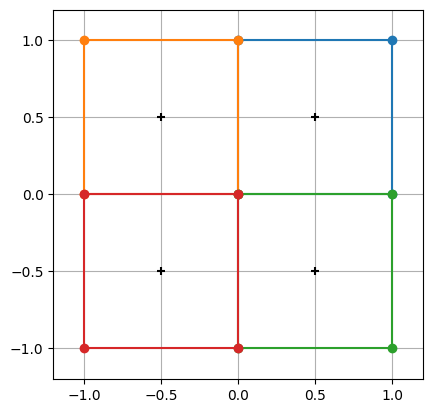

In [4]:
from matplotlib import pyplot as plt
import numpy as np

axes = plt.axes()
axes.grid()

# Plot the centres of each field
axes.scatter(array_centres[:, 0], array_centres[:, 1], c='k', marker='+', zorder=2)

# Plot the corners of each field
for field_corners in array_corners:
    axes.scatter(field_corners[:, 0], field_corners[:, 1], zorder=2)
    # Plot lines between the corners
    # (note we need to add on the first corner to the end of the array to complete the loop)
    axes.plot(
        np.append(field_corners[:, 0], field_corners[0, 0]),
        np.append(field_corners[:, 1], field_corners[0, 1]),
    )

# Force the axes to have a 1:1 ratio
axes.set_aspect('equal')
axes.set_xlim(-1.2, 1.2)
axes.set_ylim(-1.2, 1.2)

plt.show()

Let's plot a few more interesting examples, to show how the parameters can be changed.

In [5]:
def plot_array(**array_params):
    axes = plt.axes()
    axes.grid()
    axes.set_aspect('equal', adjustable='datalim')  # Force the axes to have a 1:1 ratio

    # Define the array points
    array_centres, array_corners = create_array(**array_params)

    # Plot the centres and corners
    axes.scatter(array_centres[:, 0], array_centres[:, 1], c='k', marker='+', zorder=2)
    for field_corners in array_corners:
        # axes.scatter(field_corners[:, 0], field_corners[:, 1], zorder=2)
        # Plot lines between the corners (need to add on the first corner to the end of the array)
        axes.plot(
            np.append(field_corners[:, 0], field_corners[0, 0]),
            np.append(field_corners[:, 1], field_corners[0, 1]),
        )

    plt.show()

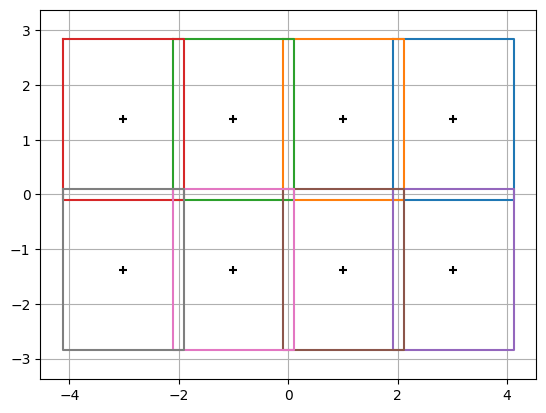

In [6]:
# The default with no arguments gives the GOTO 8-UT array
plot_array()

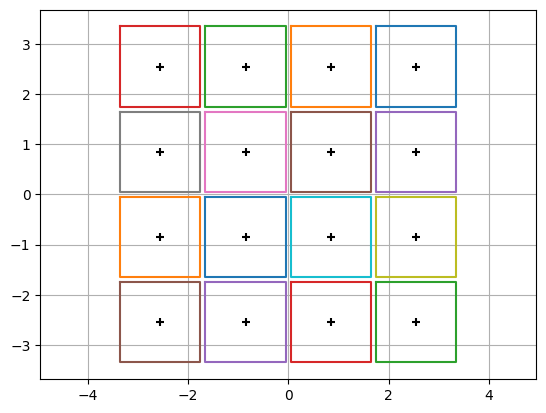

In [7]:
# This is approximately the ZTF array
plot_array(fov=(1.6, 1.6), shape=(4, 4), overlap=-0.1)

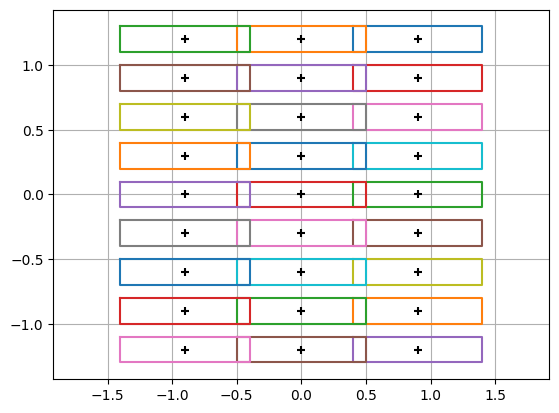

In [8]:
# Just a random example of a weird grid
plot_array(fov=(1, 0.2), shape=(3, 9), overlap=(0.1, -0.1))

At this point we're only dealing with the relative positions of the fields, so we'll use the `gototile.geometry.onsky_offset()` function to convert these to on-sky coordinates.

The `onsky_offset()` function takes a central (ra,dec) position (usually an `astropy.coordinates.SkyCoord` object) and the relative (ra,dec) positions of the fields, and returns a vector `SkyCoord` array with the on-sky (ra,dec) positions of the fields.

In [9]:
from astropy.coordinates import SkyCoord
from astropy import units as u

from gototile.geometry import onsky_offset

# We'll use the default GOTO array
array_centres, array_corners = create_array()

# Pick some random coordinates to centre the array on
centre_radec = SkyCoord('20h40m 73d15m')

# Offset the centres of each field relative to the central point
array_centres_radec = onsky_offset(centre_radec, array_centres * u.deg)
print(array_centres_radec)

# Loop through each field and offset the corners
for field_corners in array_corners:
    array_corners_radec = onsky_offset(centre_radec, field_corners * u.deg)
    print(array_corners_radec)

<SkyCoord (ICRS): (ra, dec) in deg
    [(321.23262472, 74.33933382), (313.78430043, 74.59299765),
     (306.21569957, 74.59299765), (298.76737528, 74.33933382),
     (319.60680523, 71.63439412), (313.22655048, 71.84810839),
     (306.77344952, 71.84810839), (300.39319477, 71.63439412)]>
<SkyCoord (ICRS): (ra, dec) in deg
    [(317.89356482, 75.97226291), (326.67172516, 75.51521604),
     (323.95526612, 72.66781953), (316.56280555, 73.04521312)]>
<SkyCoord (ICRS): (ra, dec) in deg
    [(309.58425061, 76.09964825), (318.70873395, 75.9442672 ),
     (317.24363824, 73.02220631), (309.65501867, 73.14971187)]>
<SkyCoord (ICRS): (ra, dec) in deg
    [(301.29126605, 75.9442672 ), (310.41574939, 76.09964825),
     (310.34498133, 73.14971187), (302.75636176, 73.02220631)]>
<SkyCoord (ICRS): (ra, dec) in deg
    [(293.32827484, 75.51521604), (302.10643518, 75.97226291),
     (303.43719445, 73.04521312), (296.04473388, 72.66781953)]>
<SkyCoord (ICRS): (ra, dec) in deg
    [(316.63868676, 73.243887

In this case note that we get a vector `SkyCoord` returned for the centres of the eight fields, and then for each we get a vector `SkyCoord` array with the four corners.

To make things easier we'll combine the corners into a single list, which we can iterate through when plotting. Note this gives a list with len=8 comprising of vector (len=4) `SkyCoord` objects. You can make things slightly nicer by making it into a 2D SkyCoord array, but notice just doing `SkyCoord(array_corners)` flattens the array so we need to reshape afterwards.

In [10]:
array_corners_radec = [onsky_offset(centre_radec, corners * u.deg) for corners in array_corners]
print(len(array_corners_radec))

array_corners_radec = SkyCoord(array_corners_radec)
print(array_corners_radec.shape)

array_corners_radec = array_corners_radec.reshape(8, 4)
print(array_corners_radec.shape)
print(array_corners_radec)

8
(32,)
(8, 4)
<SkyCoord (ICRS): (ra, dec) in deg
    [[(317.89356482, 75.97226291), (326.67172516, 75.51521604),
      (323.95526612, 72.66781953), (316.56280555, 73.04521312)],
     [(309.58425061, 76.09964825), (318.70873395, 75.9442672 ),
      (317.24363824, 73.02220631), (309.65501867, 73.14971187)],
     [(301.29126605, 75.9442672 ), (310.41574939, 76.09964825),
      (310.34498133, 73.14971187), (302.75636176, 73.02220631)],
     [(293.32827484, 75.51521604), (302.10643518, 75.97226291),
      (303.43719445, 73.04521312), (296.04473388, 72.66781953)],
     [(316.63868676, 73.24388742), (324.11159705, 72.8618506 ),
      (322.10458532, 69.98933652), (315.67029767, 70.31101814)],
     [(309.65099426, 73.3497082 ), (317.32722833, 73.22059171),
      (316.26006098, 70.2914616 ), (309.70226547, 70.39975553)],
     [(302.67277167, 73.22059171), (310.34900574, 73.3497082 ),
      (310.29773453, 70.39975553), (303.73993902, 70.2914616 )],
     [(295.88840295, 72.8618506 ), (303.3613132

Now we can plot the array centred on the target position, with some nice formatting:

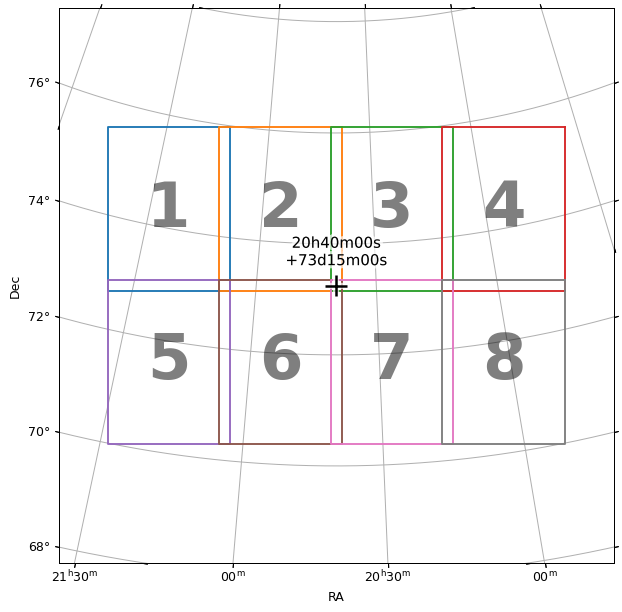

In [11]:
import matplotlib.patheffects as pe

fig = plt.figure(figsize=(12, 8), dpi=90)
axes = fig.add_subplot(projection='astro zoom', center=centre_radec, radius=f'5 deg')
axes.grid()
transform = axes.get_transform('world')

# Plot the target coordinates
axes.scatter(
    centre_radec.ra.value,
    centre_radec.dec.value,
    c='k',
    marker='+',
    s=300,
    zorder=3,
    linewidth=2,
    path_effects=[pe.withStroke(linewidth=5, foreground='w', alpha=0.7)],
    transform=transform,
)
axes.text(
    centre_radec.ra.value,
    centre_radec.dec.value,
    centre_radec.to_string('hmsdms').replace(' ', '\n') + '\n',
    ha='center',
    va='bottom',
    c='k',
    fontsize=12,
    zorder=3,
    path_effects=[pe.withStroke(linewidth=5, foreground='w', alpha=0.7)],
    transform=transform,
)

# Plot numbers at the field centres
for i, centre in enumerate(array_centres_radec):
    axes.text(
        centre.ra.value,
        centre.dec.value,
        i + 1,
        fontsize=50,
        weight='bold',
        alpha=0.5,
        ha='center',
        va='center',
        zorder=2,
        transform=transform,
    )

# Now outline the corners of each field
for corners in array_corners_radec:
    axes.plot(
        np.append(corners.ra.value, corners.ra.value[0]),
        np.append(corners.dec.value, corners.dec.value[0]),
        transform=transform,
    )

axes.set_xlabel('RA')
axes.set_ylabel('Dec')

plt.show()

There you have it, now for any point in the sky if you have a defined array you can find the on-sky coordinates of the array fields.

## Using arrays with grids

Most use cases of GOTO-tile will revolve around the `gototile.grid.SkyGrid` class. Whe defining arrays to be used with a grid you don't need to use the above functions, instead just give the parameters using the `array_params` argument.

In [12]:
from gototile.grid import SkyGrid

grid = SkyGrid(
    fov=(3, 2),
    overlap=(0.1, 0.1),
    array_params={'fov': (1.6, 1.6), 'shape': (4, 4), 'overlap': -0.1},
)

The default named GOTO grids already have arrays predefined based on the theoretical UT arrangement. So when using the `SkyGrid.from_name` method you don't need to do anything else.

In [13]:
grid = SkyGrid.from_name('GOTO')
print(grid.array_params)

((2.21, 2.95), (4, 2), 0.2)


Here we have the field of view of each UT as 2.21x2.95 degrees, the 8-UT array arranged into 4 columns and 2 rows, and an overlap of 0.2 between each field.

The centres and corners of the fields for each tile in the grid are stored as `grid.array_coords` and `grid.array_vertices`, just like `grid.coords` and `grid.vertices` do the same for each tile.

In [14]:
index = grid.tilenames.index('T0042')
print(f'Grid tile name: {grid.tilenames[i]}')
print(f'Central coordinates:\n {grid.coords[i].to_string("hmsdms")}')
print(f'Corner points:\n {grid.vertices[i].to_string("hmsdms")}')

print(f'UT field centres:\n {grid.array_coords[i].to_string("hmsdms")}')
print(f'Field 1 corners:\n {grid.array_vertices[i][0].to_string("hmsdms")}')

Grid tile name: T0008
Central coordinates:
 05h20m00s -82d03m21.81818182s
Corner points:
 ['03h57m29.64705946s -78d35m31.94057156s', '06h42m30.35294054s -78d35m31.94057156s', '07h50m36.4750499s -83d27m01.64062138s', '02h49m23.5249501s -83d27m01.64062138s']
UT field centres:
 ['06h32m03.13989136s -80d12m35.39976197s', '05h44m43.47415094s -80d37m39.11492362s', '04h55m16.52584906s -80d37m39.11492362s', '04h07m56.86010864s -80d12m35.39976197s', '06h58m51.73497205s -82d46m31.12314717s', '05h54m51.74171182s -83d21m18.01179919s', '04h45m08.25828818s -83d21m18.01179919s', '03h41m08.26502795s -82d46m31.12314717s']
Field 1 corners:
 ['06h00m20.27829918s -79d02m26.71671732s', '06h44m03.43005911s -78d27m25.20031362s', '07h11m18.02005869s -81d08m45.1522763s', '06h14m55.51182022s -81d55m41.8104678s']


## Plotting grid arrays

When you're considering the entire grid things can be made easier by using the in-built methods. Specifically `SkyGrid.plot_array`, which works just like `SkyGrid.plot_tiles`. Internally it uses `create_array` and `onsky_offset` as above, and after the first time you use it the results are cached to save time. It creates and returns a matplotlib `PathCollection` covering all the fields for the given tiles, and any formatting arguments are passed to the collection.

### Plotting the array

Here's a really simple example to show how the array fields are shown on an all-sky plot.

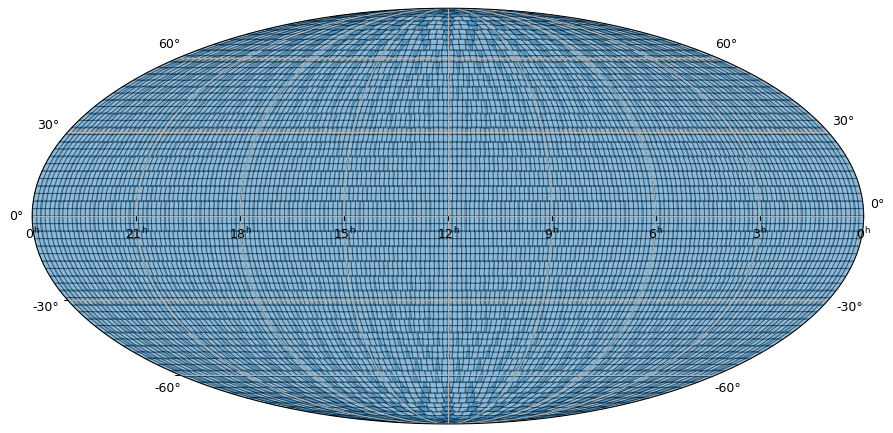

In [15]:
fig = plt.figure(figsize=(12, 6), dpi=90)
axes = fig.add_subplot(projection='astro hours mollweide')
axes.grid()

# Plot the array fields
grid.plot_array(axes, alpha=0.5)

plt.show()

### Plotting all-sky field data

Let's say we have some values assigned to each field in the overall grid. We can easily plot them using `plot_array`.

In [16]:
# Create an array of random data, with 8 values for each tile
data = np.random.rand(grid.ntiles, 8)
print(data.shape)

(1048, 8)


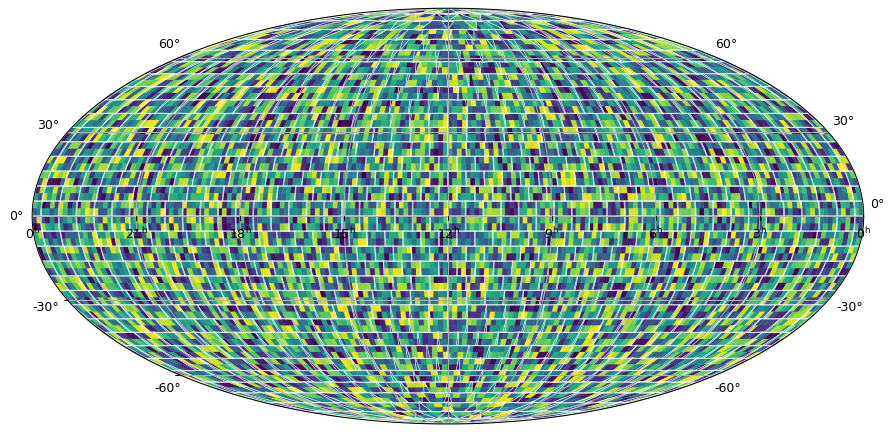

In [17]:
fig = plt.figure(figsize=(12, 6), dpi=90)
axes = fig.add_subplot(projection='astro hours mollweide')
axes.grid()

# Plot the array fields with the given data
# Note we need to flatten the 2D array to pass it to the PathCollection
grid.plot_array(axes, ec='none', array=data.flatten(), zorder=1)

# Plot the basic grid tile outlines on top in white
grid.plot_tiles(axes, fc='none', ec='white', zorder=1.1)

plt.show()

### Plotting specific tile arrays

You don't have to plot every field for every tile if you're zoomed in, the `plot_array` method takes a `tilenames=` argument just like `plot_grid`. Here's a really simple plot to show only some specific tiles that contain a given point:

In [18]:
target_coords = SkyCoord('04h40m 77d50m')
target_tiles = grid.get_tile(target_coords, overlap=True)
print(target_tiles)

['T1024', 'T1025']


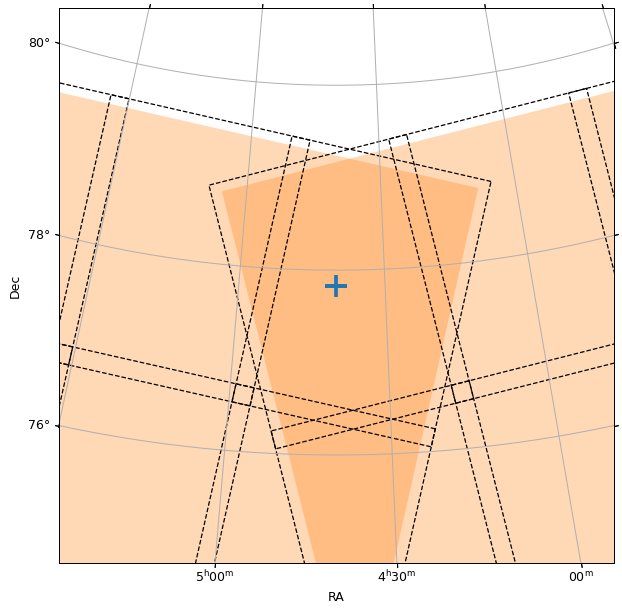

In [19]:
fig = plt.figure(figsize=(12, 8), dpi=90)
axes = fig.add_subplot(projection='astro zoom', center=target_coords, radius=f'3 deg')
axes.grid()

# Mark the target
axes.scatter(
    target_coords.ra.value,
    target_coords.dec.value,
    s=300,
    c='tab:blue',
    marker='+',
    lw=3,
    zorder=9,
    transform=axes.get_transform('world'),
)

# Fill the areas of the tiles
grid.plot_tiles(axes, target_tiles, fc='tab:orange', ec='none', alpha=0.3, zorder=1)

# Outline the arrays
grid.plot_array(axes, target_tiles, fc='none', ec='k', lw=1, ls='dashed', zorder=1.2)

axes.set_xlabel('RA')
axes.set_ylabel('Dec')

plt.show()

### More examples

Here we want to make a nicer version of the all-sky plot, showing off the entire grid.

The only tricky bit here is making the arrays of colours and alpha values, and then most of the code is for duplicating the tile names that are on both the left and right sides of the grid.

In [20]:
# We want each tile to be a different colour, loop through the MPL colour cycle
import matplotlib.colors as mcolors

tab_colours = list(mcolors.TABLEAU_COLORS.keys())
tile_colours = [tab_colours[i % len(tab_colours)] for i in range(grid.ntiles)]

# Each UT will have the same colour as its parent tile
ut_colours = np.array([[tile_colours[i]] * 8 for i in range(grid.ntiles)])

# For contrast, change the alphas for each UT
ut_alphas = [0.3, 0.4, 0.3, 0.4, 0.4, 0.3, 0.4, 0.3] * grid.ntiles

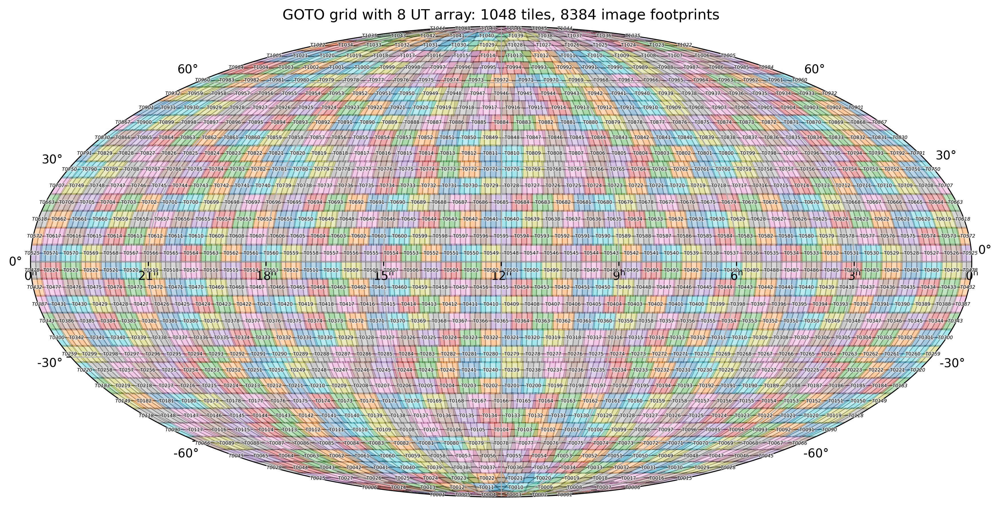

In [21]:
fig = plt.figure(figsize=(12, 6), dpi=300)
axes = fig.add_subplot(projection='astro hours mollweide')
axes.grid()
transform = axes.get_transform('world')

# Plot the edges of the array fields
grid.plot_array(axes, fc='none', ec='black', lw=0.1, zorder=1.2)

# Fill each array in a different colour
grid.plot_array(axes, fc=ut_colours.flatten(), ec='none', alpha=ut_alphas, zorder=1)

# Add tile names
for i in range(grid.ntiles):
    if grid.coords[i].ra.deg != 0:
        axes.text(
            grid.coords[i].ra.deg,
            grid.coords[i].dec.deg,
            grid.tilenames[i],
            fontsize=4,
            c='k',
            ha='center',
            va='center',  # clip_on=True,
            path_effects=[pe.withStroke(linewidth=1, foreground='white', alpha=0.7)],
            zorder=2,
            transform=transform,
        )
    else:
        # For tiles at RA=0, plot tile names on both sides of the globe
        # Note we don't clip, so the text will be visible outside of the axes
        axes.text(
            0.5,
            grid.coords[i].dec.deg,
            grid.tilenames[i],
            fontsize=4,
            c='k',
            style='italic',
            ha='center',
            va='center',  # clip_on=True,
            path_effects=[pe.withStroke(linewidth=1, foreground='white', alpha=0.7)],
            zorder=2,
            transform=transform,
        )
        axes.text(
            -0.5,
            grid.coords[i].dec.deg,
            grid.tilenames[i],
            fontsize=4,
            c='k',
            style='italic',
            ha='center',
            va='center',  # clip_on=True,
            path_effects=[pe.withStroke(linewidth=1, foreground='white', alpha=0.7)],
            zorder=2,
            transform=transform,
        )

# Add a title
axes.set_title(
    f'GOTO grid with 8 UT array: {grid.ntiles} tiles, {grid.ntiles * 8} image footprints'
)

fig.tight_layout()
plt.show()

Finally here we focus on the north pole, where you can really see how the overlap between tiles matches to individual fields.

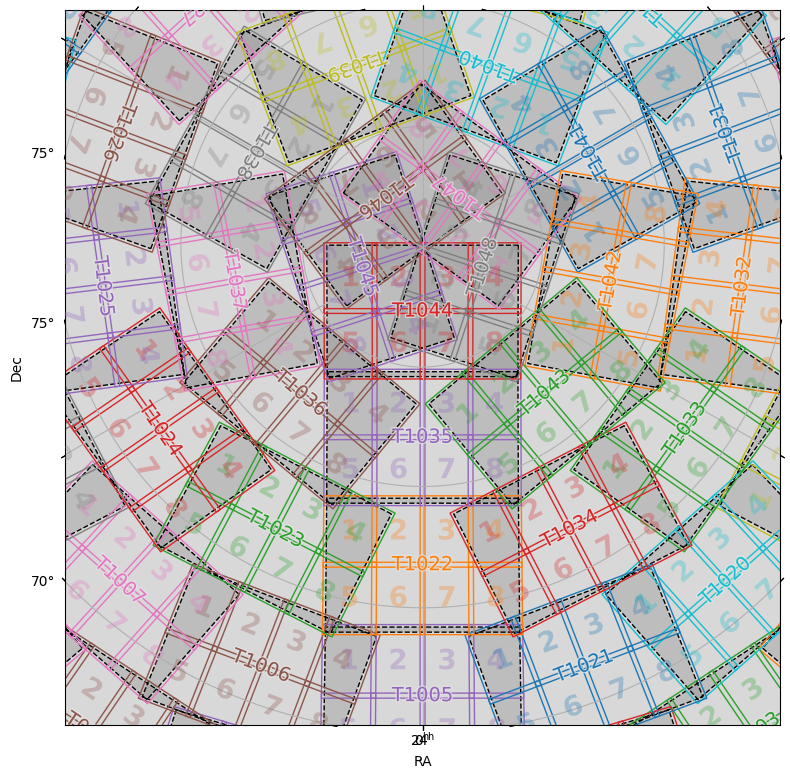

In [22]:
fig = plt.figure(figsize=(8, 8))
axes = fig.add_subplot(
    projection='astro zoom', center=SkyCoord(0 * u.deg, 85 * u.deg), radius=f'15 deg'
)
axes.grid()
axes.set_axisbelow(False)
transform = axes.get_transform('world')

# Plot the grid tiles
grid.plot_tiles(axes, fc='none', ec='k', lw=1, ls='dashed', zorder=1)
grid.plot_tiles(axes, fc='0.5', ec='none', alpha=0.3, zorder=0)

# Plot the outlines of the array fields
grid.plot_array(axes, fc='none', ec=ut_colours.flatten(), lw=1, zorder=2)

# Plot the tile names and UT numbers
for i in range(grid.ntiles):
    color = tab_colours[i % len(tab_colours)]
    # Only add text for tiles above 60 degrees declination
    if grid.coords[i].dec.deg > 60:
        axes.text(
            grid.coords[i].ra.deg,
            grid.coords[i].dec.deg,
            grid.tilenames[i],
            fontsize=14,
            color=color,
            ha='center',
            va='center',
            clip_on=True,
            rotation=-1 * grid.coords[i].ra.deg,
            path_effects=[pe.withStroke(linewidth=2, foreground='0.9', alpha=0.7)],
            zorder=5,
            transform=transform,
        )
        # Now add the UT numbers for each tile
        for j in range(8):
            axes.text(
                grid.array_coords[i][j].ra.value,
                grid.array_coords[i][j].dec.value,
                j + 1,
                fontsize=20,
                color=color,
                weight='bold',
                ha='center',
                va='center',
                clip_on=True,
                rotation=-1 * grid.coords[i].ra.deg,
                path_effects=[pe.withStroke(linewidth=2, foreground='white', alpha=0)],
                alpha=0.3,
                zorder=4,
                transform=transform,
            )

axes.set_xlabel('RA')
axes.set_ylabel('Dec')

fig.tight_layout()
plt.show()

It looks a bit like a kaleidoscope, but you can visualise for instance that T1022 UT1 overlaps almost entirely with T1023 UT4 (minus some rotation), likewise T1022 UT4 overlaps with T1034 UT1 and so on...